# Xai Project  

Dataset - https://www.kaggle.com/datasets/hadiurrahmannabil/banana-leaf-spot-disease-detection

In [ ]:
import zipfile
import os

dataset_path = '/content/Banana Leaf disease XAI.v2i.coco.zip'
output_dir = '/content/'
with zipfile.ZipFile(dataset_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

os.listdir(output_dir)

['.config',
 'README.roboflow.txt',
 'test',
 'valid',
 'Banana Leaf disease XAI.v2i.coco.zip',
 'train',
 'README.dataset.txt',
 'sample_data']

In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import collections

base_dir = '/content/'
folders = ['train', 'valid', 'test']


all_categories = {}
coco_data = {}

# Function to load and check annotation files
def check_annotations(folder_name):
    annotation_file = os.path.join(base_dir, folder_name, '_annotations.coco.json')

    if os.path.exists(annotation_file):
        print(f"\nChecking annotations for the {folder_name} folder:")
        with open(annotation_file, 'r') as f:
            coco_data[folder_name] = json.load(f)

        # Print an overview of the annotations
        print("Categories: ", coco_data[folder_name].get('categories', 'No categories found'))
        print("Number of Images: ", len(coco_data[folder_name].get('images', [])))
        print("Number of Annotations: ", len(coco_data[folder_name].get('annotations', [])))

        # Add categories to the global dictionary
        for category in coco_data[folder_name]['categories']:
            all_categories[category['id']] = category['name']

        # Check if 'image_id', 'category_id', and 'bbox' fields are present in annotations
        if coco_data[folder_name].get('annotations'):
            for annotation in coco_data[folder_name]['annotations'][:5]:  # Print first 5 annotations as a sample
                print("Annotation example: ", annotation)
                assert 'image_id' in annotation, "Missing 'image_id' in annotation"
                assert 'category_id' in annotation, "Missing 'category_id' in annotation"
                assert 'bbox' in annotation, "Missing 'bbox' in annotation"
        else:
            print(f"No annotations found in {folder_name}!")
    else:
        print(f"Annotation file not found in {folder_name} folder")

# Check annotations for all folders: train, valid, test
for folder in folders:
    check_annotations(folder)


Checking annotations for the train folder:
Categories:  [{'id': 0, 'name': 'Banana', 'supercategory': 'none'}, {'id': 1, 'name': 'cordana', 'supercategory': 'Banana'}, {'id': 2, 'name': 'healthy', 'supercategory': 'Banana'}, {'id': 3, 'name': 'pestalotiopsis', 'supercategory': 'Banana'}, {'id': 4, 'name': 'sigatoka', 'supercategory': 'Banana'}]
Number of Images:  220
Number of Annotations:  598
Annotation example:  {'id': 0, 'image_id': 0, 'category_id': 4, 'bbox': [193, 371, 187, 103], 'area': 19261, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 1, 'image_id': 0, 'category_id': 4, 'bbox': [239, 0, 322, 122], 'area': 39284, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 2, 'image_id': 1, 'category_id': 2, 'bbox': [252, 258, 202, 270], 'area': 54540, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 3, 'image_id': 1, 'category_id': 2, 'bbox': [26, 96, 204, 256], 'area': 52224, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 4, 'i

In [ ]:
# Extract category names from the aggregated categories
print("\nAll Disease categories across datasets: ", all_categories)


All Disease categories across datasets:  {0: 'Banana', 1: 'cordana', 2: 'healthy', 3: 'pestalotiopsis', 4: 'sigatoka'}


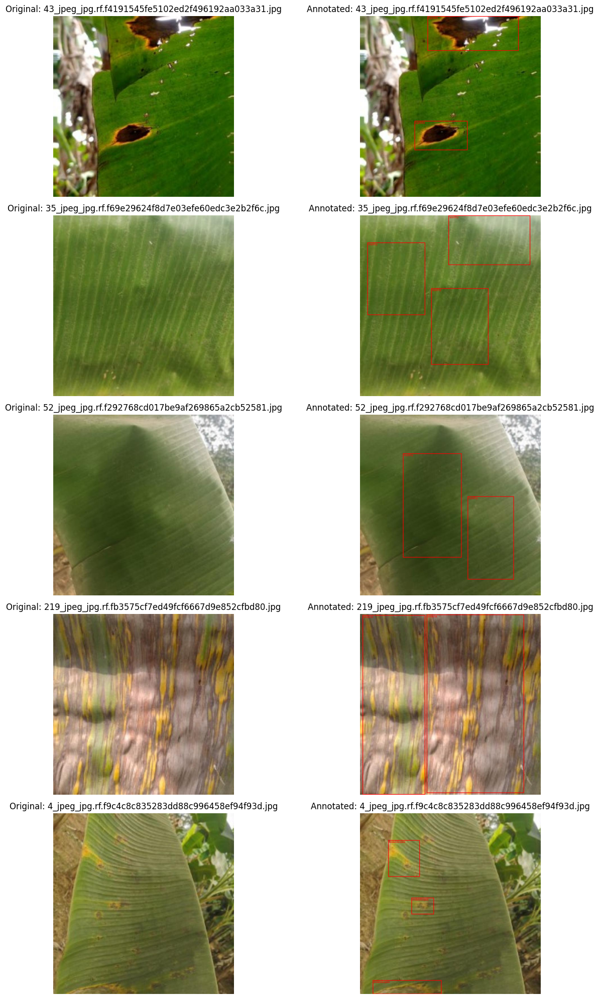

In [ ]:
# Function to display images and annotations for a specific image
def display_image_with_annotations(folder_name, image_id):
    # Find the image info
    image_info = next(img for img in coco_data[folder_name]['images'] if img['id'] == image_id)
    file_name = image_info['file_name']
    image_path = os.path.join(base_dir, folder_name, file_name)

    # Open the image
    img = Image.open(image_path)

    # Create a drawing context to draw bounding boxes
    draw = ImageDraw.Draw(img)

    # Get all annotations for the image
    image_annotations = [ann for ann in coco_data[folder_name]['annotations'] if ann['image_id'] == image_id]

    # Draw the bounding boxes and label them with class names
    for ann in image_annotations:
        category_id = ann['category_id']
        bbox = ann['bbox']
        disease_name = all_categories[category_id]

        # Draw bounding box (in COCO format, bbox = [x, y, width, height])
        x, y, width, height = bbox
        draw.rectangle([x, y, x + width, y + height], outline="red", width=2)

        # Draw label
        draw.text((x, y), disease_name, fill="red")

    return img

# Display 5 sample images with annotations from the train dataset
fig, axs = plt.subplots(5, 2, figsize=(15, 20))

for i, ax in enumerate(axs):
    # Display original image on the left
    image_info = coco_data['train']['images'][i]
    original_image_path = os.path.join(base_dir, 'train', image_info['file_name'])
    original_image = Image.open(original_image_path)
    ax[0].imshow(original_image)
    ax[0].set_title(f"Original: {image_info['file_name']}")
    ax[0].axis('off')

    # Display image with annotations on the right
    annotated_image = display_image_with_annotations('train', image_info['id'])
    ax[1].imshow(annotated_image)
    ax[1].set_title(f"Annotated: {image_info['file_name']}")
    ax[1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import torchvision.transforms as T
transform = T.Compose([
    T.Resize((640, 640)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets.coco import CocoDetection

# Load datasets using COCO format
train_dataset = CocoDetection(root=os.path.join(base_dir, 'train'),
                              annFile=os.path.join(base_dir, 'train', '_annotations.coco.json'),
                              transform=transform)

valid_dataset = CocoDetection(root=os.path.join(base_dir, 'valid'),
                              annFile=os.path.join(base_dir, 'valid', '_annotations.coco.json'),
                              transform=transform)

# Create DataLoader for train and validation sets
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
# Import the necessary libraries
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import torch
import torch.optim as optim
from tqdm import tqdm
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN

# Modify the number of classes (5 classes including background)
num_classes = 5  # 4 diseases + background

# Load pretrained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT')

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Move model to GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:02<00:00, 73.6MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
import torch
import torch.optim as optim
from tqdm import tqdm

num_epochs = 5

# Set the optimizer (using SGD as it is commonly used for object detection models)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

# Learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

def prepare_targets(targets):
    formatted_targets = []
    for t in targets:
        if len(t) == 0:
            print("No annotations for this image, skipping...")
            continue

        # Extract bounding boxes and check for validity
        boxes = torch.tensor([ann['bbox'] for ann in t if 'bbox' in ann], dtype=torch.float32)
        if boxes.size(0) == 0:
            print("No valid bounding boxes found for this image, skipping...")
            continue

        # Convert [x, y, width, height] -> [x_min, y_min, x_max, y_max]
        boxes[:, 2:] += boxes[:, :2]

        # Filter out invalid boxes (e.g., negative or zero-size)
        valid_boxes = []
        valid_labels = []
        for i, box in enumerate(boxes):
            x_min, y_min, x_max, y_max = box
            if (x_max > x_min) and (y_max > y_min):
                valid_boxes.append(box)
                valid_labels.append(t[i]['category_id'])
            else:
                print(f"Invalid bounding box removed: {box.tolist()}")

        if valid_boxes:
            formatted_target = {
                'boxes': torch.stack(valid_boxes),
                'labels': torch.tensor(valid_labels, dtype=torch.int64)
            }
            formatted_targets.append(formatted_target)
        else:
            print("No valid bounding boxes for this image, skipping...")

    return formatted_targets

# Debugging during DataLoader creation
def print_sample_annotations(dataset):
    for idx in range(5):  # Print the first 5 images for debugging
        img, annotations = dataset[idx]
        print(f"Image {idx} - Number of annotations: {len(annotations)}")
        for ann in annotations:
            print(f"  Annotation: {ann}")

print("Sample annotations from training dataset:")
print_sample_annotations(train_dataset)

Sample annotations from training dataset:
Image 0 - Number of annotations: 2
  Annotation: {'id': 0, 'image_id': 0, 'category_id': 4, 'bbox': [193, 371, 187, 103], 'area': 19261, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 1, 'image_id': 0, 'category_id': 4, 'bbox': [239, 0, 322, 122], 'area': 39284, 'segmentation': [], 'iscrowd': 0}
Image 1 - Number of annotations: 3
  Annotation: {'id': 2, 'image_id': 1, 'category_id': 2, 'bbox': [252, 258, 202, 270], 'area': 54540, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 3, 'image_id': 1, 'category_id': 2, 'bbox': [26, 96, 204, 256], 'area': 52224, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 4, 'image_id': 1, 'category_id': 2, 'bbox': [313, 0, 289, 175], 'area': 50575, 'segmentation': [], 'iscrowd': 0}
Image 2 - Number of annotations: 2
  Annotation: {'id': 5, 'image_id': 2, 'category_id': 2, 'bbox': [152, 137, 207, 368], 'area': 76176, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 6, 'image_id': 2, 'cat

In [ ]:
# Function to train for one epoch
def train_one_epoch(model, optimizer, train_loader, device, epoch):
    model.train()
    running_loss = 0.0

    # Use tqdm to show progress bar
    progress_bar = tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{num_epochs}")

    for images, targets in progress_bar:
        # Move images to the appropriate device
        images = [image.to(device) for image in images]

        # Prepare targets (fixing the structure and validating bounding boxes)
        targets = prepare_targets(targets)

        # Check if targets is empty after prepare_targets
        if not targets:
            print("Skipping this batch due to no valid targets.")
            continue

        # Move targets to the appropriate device
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Check if images and targets have the same length
        if len(images) != len(targets):
            print("Skipping this batch due to mismatch in number of images and targets.")
            continue

        # Forward pass: calculate loss
        loss_dict = model(images, targets)

        # Ensure the losses are not empty or invalid
        losses = sum(loss for loss in loss_dict.values())
        running_loss += losses.item()

        # Backward pass and optimize
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        # Update progress bar with current loss
        progress_bar.set_postfix(loss=running_loss / len(progress_bar))

    return running_loss / len(train_loader)

# Function to evaluate on the validation set
def evaluate(model, valid_loader, device):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, targets in tqdm(valid_loader, desc="Validating"):
            images = [image.to(device) for image in images]

            # Prepare targets (fixing the structure and validating bounding boxes)
            targets = prepare_targets(targets)

            if not targets:
                print("Skipping this batch due to no valid targets.")
                continue

            # Move targets to the appropriate device
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Check if images and targets have the same length
            if len(images) != len(targets):
                print("Skipping this batch due to mismatch in number of images and targets.")
                continue

            # Forward pass
            loss_dict = model(images, targets)

            # Ensure the losses are valid
            losses = sum(loss for loss in loss_dict.values())
            running_loss += losses.item()

    return running_loss / len(valid_loader)

In [ ]:
import torch

# Function to prepare targets
def prepare_targets(targets):
    formatted_targets = []

    for t in targets:
        if len(t) == 0:  # Skip images without annotations
            continue

        valid_boxes = []
        valid_labels = []

        # Process all annotations in an image
        for ann in t:
            if 'bbox' in ann:
                x, y, width, height = ann['bbox']
                x_min, y_min = x, y
                x_max, y_max = x + width, y + height  # Convert to (x_min, y_min, x_max, y_max)

                # Check if the bounding box is valid (i.e., non-zero area)
                if x_max > x_min and y_max > y_min:
                    valid_boxes.append([x_min, y_min, x_max, y_max])
                    valid_labels.append(ann['category_id'])

        # Only add if there are valid annotations
        if valid_boxes:
            formatted_target = {
                'boxes': torch.tensor(valid_boxes, dtype=torch.float32),
                'labels': torch.tensor(valid_labels, dtype=torch.int64)
            }
            formatted_targets.append(formatted_target)

    return formatted_targets if formatted_targets else None  # Return None if no valid targets found

# Assuming train_loader is already defined
def train_one_epoch(model, optimizer, train_loader, device, epoch):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Training Epoch {epoch+1}")

    for images, targets in progress_bar:
        images = [image.to(device) for image in images]
        targets = prepare_targets(targets)

        if targets is None or len(images) != len(targets):
            continue  # Skip if no valid targets or mismatch in images and targets

        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        running_loss += losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        # Update the progress bar with current loss
        progress_bar.set_postfix(loss=running_loss / len(progress_bar))

    return running_loss / len(train_loader)

# Train the model with a loader that provides images and corresponding annotations
def train_model(model, train_loader, num_epochs, optimizer, scheduler, device):
    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        print(f"Epoch {epoch+1}, Loss: {train_loss}")

        scheduler.step()

# Load pretrained model, optimizer, scheduler, etc. (as described before)
# Assuming you have a DataLoader 'train_loader' that returns images and corresponding annotations
train_model(model, train_loader, num_epochs=5, optimizer=optimizer, scheduler=lr_scheduler, device=device)

Training Epoch 1: 100%|██████████| 55/55 [00:42<00:00,  1.29it/s, loss=0.304]


Epoch 1, Loss: 0.3040621635588733


Training Epoch 2: 100%|██████████| 55/55 [00:42<00:00,  1.30it/s, loss=0.289]


Epoch 2, Loss: 0.2894275944341313


Training Epoch 3: 100%|██████████| 55/55 [00:42<00:00,  1.30it/s, loss=0.282]


Epoch 3, Loss: 0.2824415973641656


Training Epoch 4: 100%|██████████| 55/55 [00:42<00:00,  1.31it/s, loss=0.276]


Epoch 4, Loss: 0.27607124881310896


Training Epoch 5: 100%|██████████| 55/55 [00:42<00:00,  1.29it/s, loss=0.275]

Epoch 5, Loss: 0.2750951398502697


In [ ]:
# Load test dataset using COCO format
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=transform)

# Create DataLoader for the test set
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
from torchvision.ops import box_iou

def evaluate_on_test(model, test_loader, device):
    model.eval()  # Set model to evaluation mode
    all_boxes = []
    all_labels = []
    all_scores = []

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, targets in tqdm(test_loader, desc="Evaluating"):
            images = [image.to(device) for image in images]

            # Prepare targets (fixing the structure and validating bounding boxes)
            targets = prepare_targets(targets)

            # Get predictions
            predictions = model(images)

            # Collect boxes, labels, and scores for evaluation
            for i, prediction in enumerate(predictions):
                if len(prediction['boxes']) > 0:
                    all_boxes.append(prediction['boxes'].cpu())
                    all_labels.append(prediction['labels'].cpu())
                    all_scores.append(prediction['scores'].cpu())

    return all_boxes, all_labels, all_scores

In [ ]:
import numpy as np
import torch
from sklearn.metrics import average_precision_score

def compute_map(all_boxes, all_labels, all_scores, num_classes):
    y_true = np.zeros((0, num_classes))  # Initialize empty one-hot encoded array
    y_scores = np.zeros((0, num_classes))  # Initialize empty 2D scores array

    for cls in range(num_classes):
        cls_boxes = []
        cls_scores = []
        cls_labels = []

        for boxes, labels, scores in zip(all_boxes, all_labels, all_scores):
            # Ensure labels is a NumPy array
            labels = labels.numpy() if isinstance(labels, torch.Tensor) else labels

            # Create a mask for the current class
            cls_mask = (labels == cls)
            if np.any(cls_mask):  # Ensure there are samples for this class
                cls_boxes.append(boxes[cls_mask])
                cls_scores.append(scores[cls_mask])
                cls_labels.append(labels[cls_mask])

        if cls_boxes:
            cls_boxes = torch.cat(cls_boxes)
            cls_scores = torch.cat(cls_scores)

            # Convert cls_labels to tensors before concatenation
            cls_labels = torch.cat([torch.from_numpy(l) for l in cls_labels])

            # Prepare true labels in one-hot encoding
            cls_true_labels = np.zeros((len(cls_labels), num_classes))
            cls_true_labels[:, cls] = 1  # Set the corresponding class index to 1

            # Append true labels and scores
            y_true = np.vstack((y_true, cls_true_labels))

            # Convert cls_scores to 2D array where each class has its own column
            cls_score_2d = np.zeros((len(cls_scores), num_classes))
            cls_score_2d[:, cls] = cls_scores.numpy()  # Put scores in the corresponding class column
            y_scores = np.vstack((y_scores, cls_score_2d))

    # Calculate average precision
    average_precision = average_precision_score(y_true, y_scores, average='macro')
    return average_precision

In [ ]:
# Evaluate on the test dataset
all_boxes, all_labels, all_scores = evaluate_on_test(model, test_loader, device)

Evaluating: 100%|██████████| 11/11 [00:04<00:00,  2.72it/s]


In [ ]:
# Compute mAP
map_score = compute_map(all_boxes, all_labels, all_scores, num_classes)
print(f"Mean Average Precision (mAP) on the test dataset: {map_score:.4f}")

Mean Average Precision (mAP) on the test dataset: 0.8420


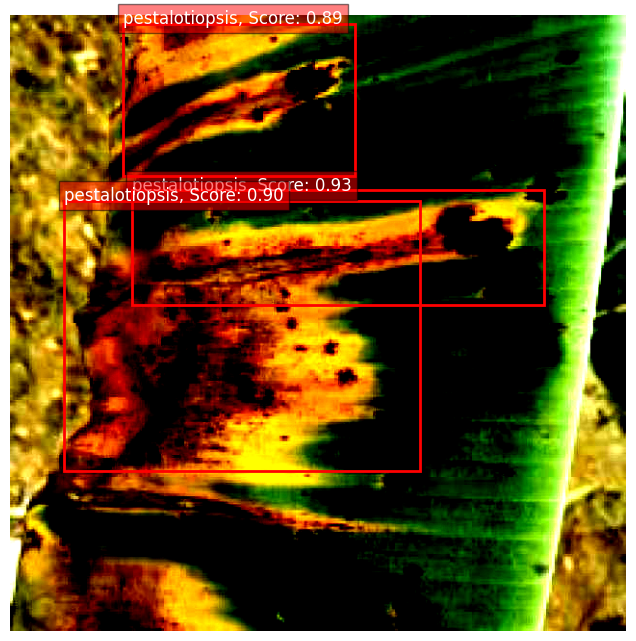

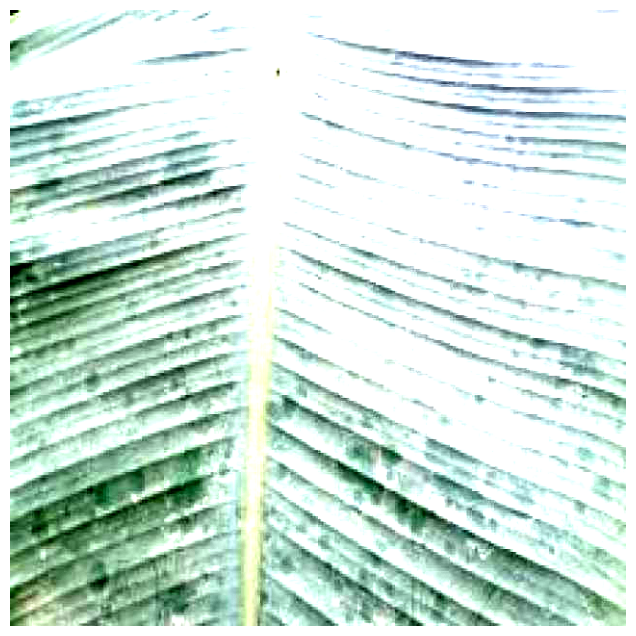

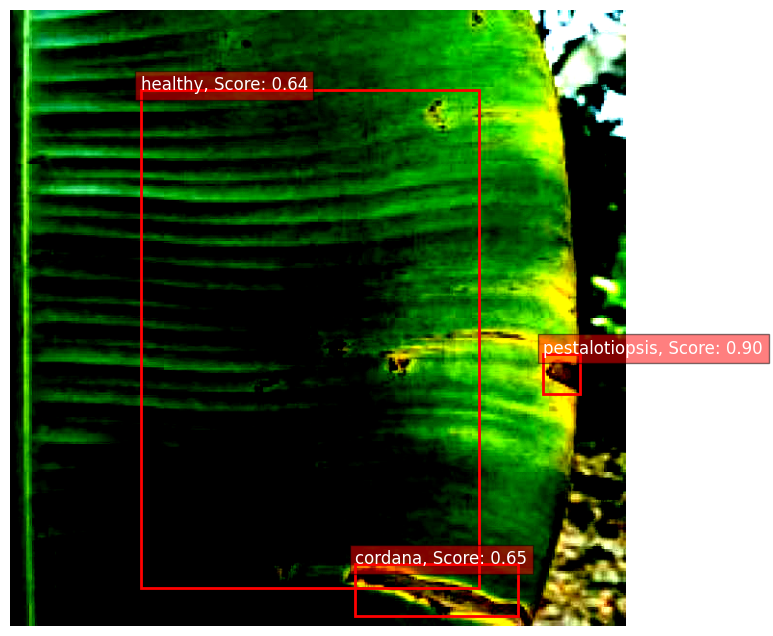

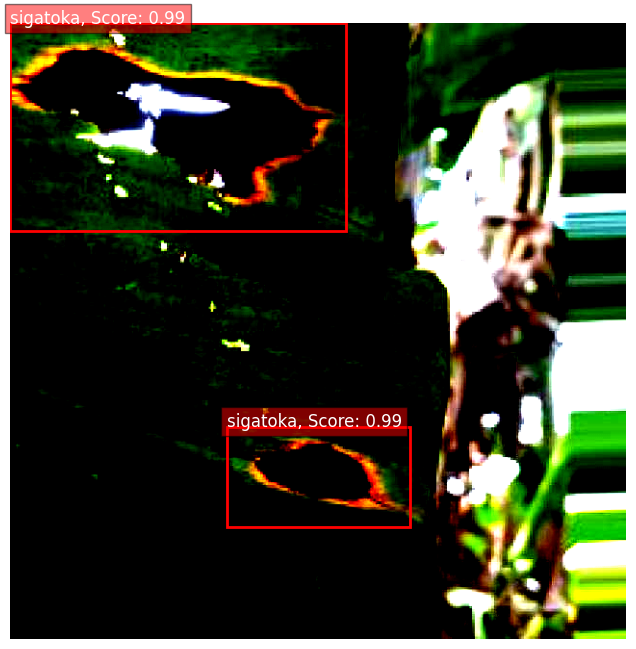

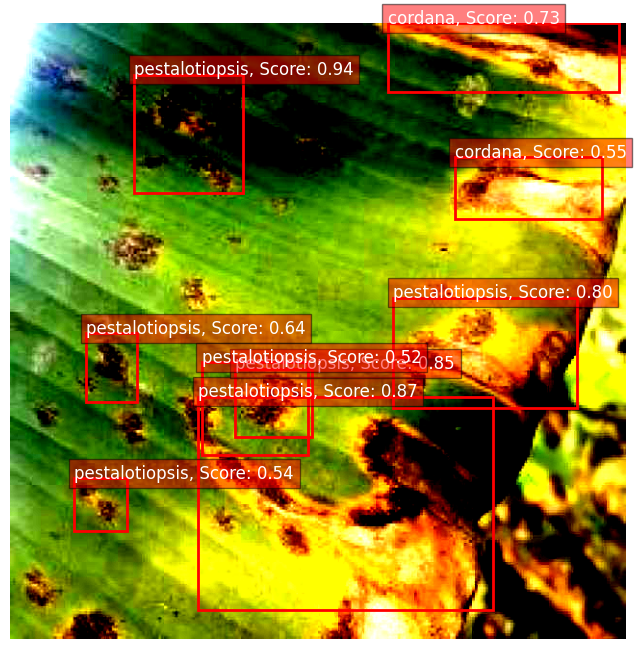

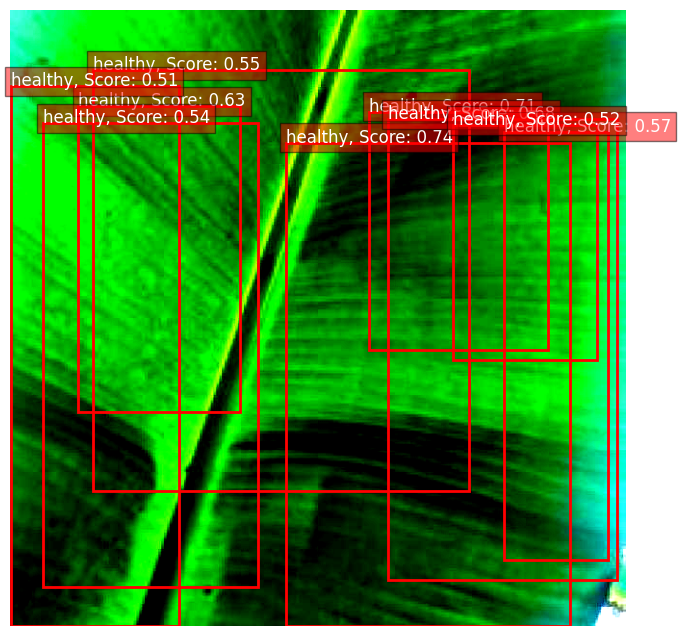

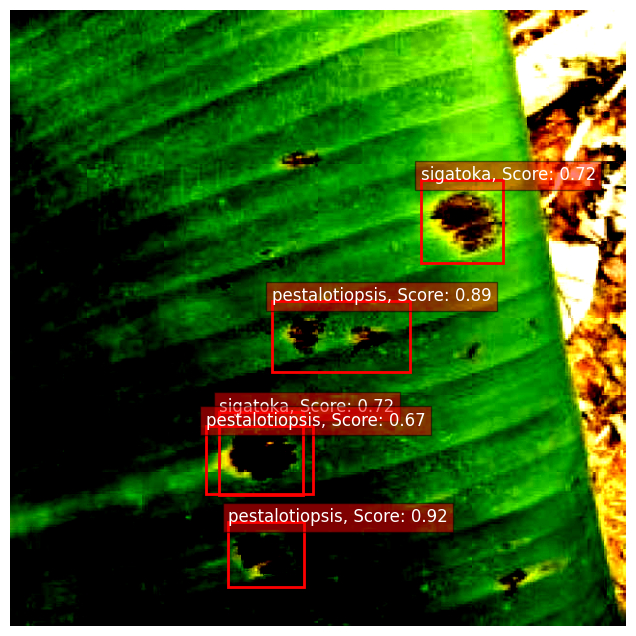

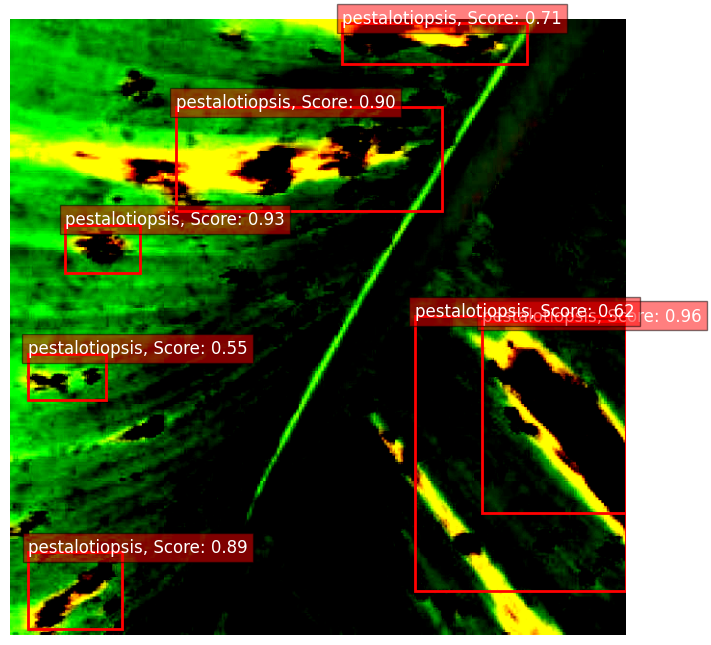

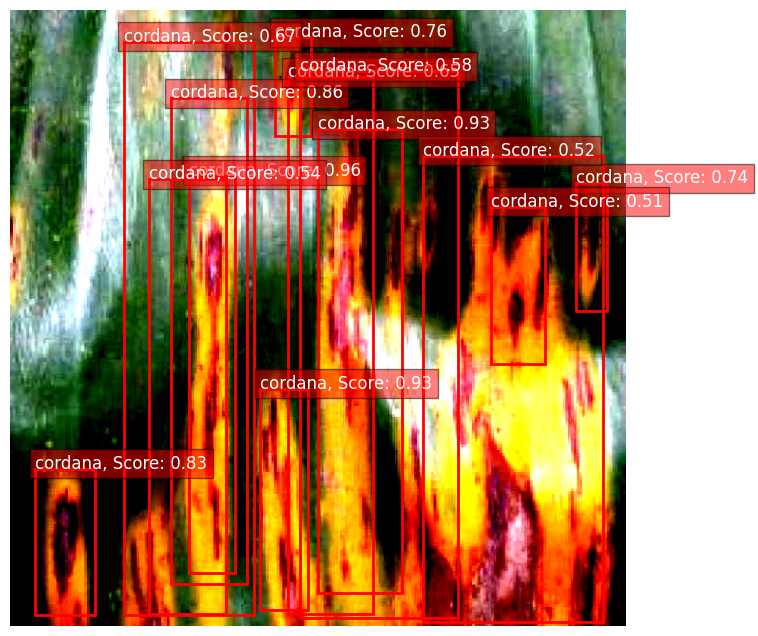

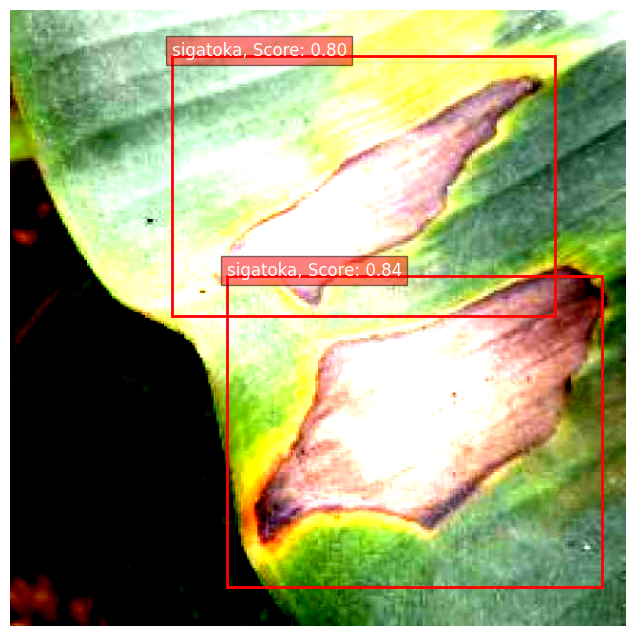

In [ ]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
class_names = {0: 'Banana', 1: 'cordana', 2: 'healthy', 3: 'pestalotiopsis', 4: 'sigatoka'}
# Function to visualize predictions
def visualize_predictions(images, predictions, class_names, num_samples=10):
    for i in range(num_samples):
        # Get the original image
        image = images[i].permute(1, 2, 0).cpu().numpy()  # Convert to HWC format

        # Draw predicted boxes
        boxes = predictions[i]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
        labels = predictions[i]['labels'].cpu().detach().numpy()
        scores = predictions[i]['scores'].cpu().detach().numpy()

        # Display the image
        plt.figure(figsize=(12, 8))
        plt.imshow(image)

        for box, label, score in zip(boxes, labels, scores):
            if score > 0.5:  # Show boxes with a score above a certain threshold
                x_min, y_min, x_max, y_max = box  # Adjust based on your box format
                rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     fill=False, color='red', linewidth=2)
                plt.gca().add_patch(rect)
                # Replace label with class name
                class_name = class_names[int(label)]
                plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                         color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

        plt.axis('off')
        plt.show()

# Function to evaluate and get predictions from the model
def get_predictions(model, data_loader, device):
    model.eval()
    all_images = []
    all_predictions = []

    with torch.no_grad():
        for images, _ in data_loader:  # Get only images, ignore targets
            images = [img.to(device) for img in images]
            predictions = model(images)  # Forward pass
            all_images.extend(images)
            all_predictions.extend(predictions)

    return all_images, all_predictions


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Get predictions
all_images, all_predictions = get_predictions(model, test_loader, device)

# Visualize the results
visualize_predictions(all_images, all_predictions, class_names, num_samples=10)

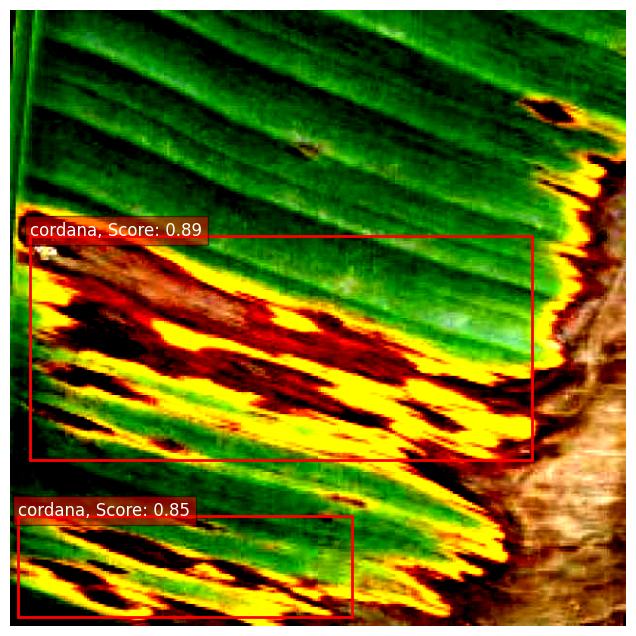

In [ ]:
import matplotlib.pyplot as plt

import torch
from PIL import Image
import torchvision.transforms as T

# Function to preprocess the image
def preprocess_image(image_path, device):
    # Define the transformation for the input image (Resize, Normalize, etc.)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Load the image using PIL
    image = Image.open(image_path).convert("RGB")

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image


# Function to visualize the prediction on a user-provided image
def visualize_user_image(image, predictions, class_names):
    # Convert tensor image to numpy array for visualization
    image_np = image.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Display the image
    plt.figure(figsize=(12, 8))
    plt.imshow(image_np)

    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            plt.gca().add_patch(rect)
            # Replace label with class name
            class_name = class_names[int(label)]
            plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                     color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Function to perform prediction on a user-provided image
def predict_on_user_image(model, image_path, device, class_names):
    # Preprocess the image
    image_tensor, original_image = preprocess_image(image_path, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        # Remove the extra brackets to pass the 4D tensor directly
        predictions = model(image_tensor)

    # Visualize the results
    visualize_user_image(image_tensor[0], predictions, class_names)

# Example usage:
# Let's say the user provides an image file named 'test_image.jpg'
image_path = '/content/test/49_jpeg_jpg.rf.eb1fbfea0631140eb1a284d27575f3ad.jpg'
predict_on_user_image(model, image_path, device, class_names)


In [ ]:
import torch
model_save_path = 'Banana_faster_rcnn_model.pt'
torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")

Model saved to Banana_faster_rcnn_model.pt


In [ ]:
torch.save(model, 'Banana_faster_rcnn_full_model.pt')

In [ ]:
model = torch.load('Banana_faster_rcnn_full_model.pt')
model.eval()

<ipython-input-38-2303d412c6af>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('Banana_faster_rcnn_full_model.pt')


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

<ipython-input-39-04d31f5abbc6>:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)  # Directly load the model


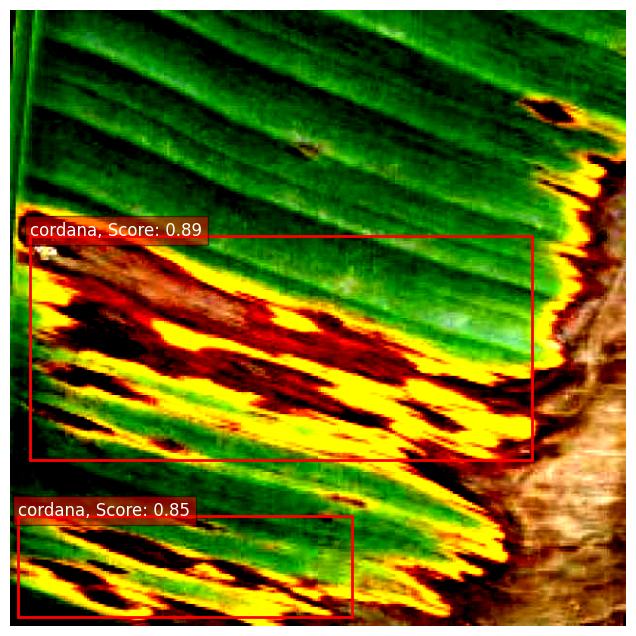

In [ ]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
import torchvision.transforms as T

# Define the class names

class_names = {0: 'Banana', 1: 'cordana', 2: 'healthy', 3: 'pestalotiopsis', 4: 'sigatoka'}

# Function to preprocess the image (updated to use from the provided code)
def preprocess_image(image_path, device):
    # Define the transformation for the input image (Resize, Normalize, etc.)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Load the image using PIL
    image = Image.open(image_path).convert("RGB")

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image

# Function to visualize the prediction on a user-provided image
def visualize_user_image(image, predictions, class_names):
    # Convert tensor image to numpy array for visualization
    image_np = image.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Display the image
    plt.figure(figsize=(12, 8))
    plt.imshow(image_np)

    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            plt.gca().add_patch(rect)
            # Replace label with class name
            class_name = class_names[int(label)]
            plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                     color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Function to perform prediction on a user-provided image
def predict_on_user_image(model, image_path, device, class_names):
    # Preprocess the image
    image_tensor, original_image = preprocess_image(image_path, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        # Remove the extra brackets to pass the 4D tensor directly
        predictions = model(image_tensor)

    # Visualize the results
    visualize_user_image(image_tensor[0], predictions, class_names)

# Load the Faster R-CNN model
model_path = '/content/drive/MyDrive/Banana_faster_rcnn_full_model.pt'
model = torch.load(model_path)  # Directly load the model
model.eval()

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Example usage:
image_path = '/content/test/49_jpeg_jpg.rf.eb1fbfea0631140eb1a284d27575f3ad.jpg'
predict_on_user_image(model, image_path, device, class_names)

In [ ]:
import os
import torch
import numpy as np
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
import torchvision.transforms as T

# Function to compute IoU between two bounding boxes
def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

# Function to compute Dice coefficient between two bounding boxes
def calculate_dice(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    dice = (2 * interArea) / float(boxAArea + boxBArea)
    return dice

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image):
    # Check if the input is a tensor; if so, return it as is
    if isinstance(image, torch.Tensor):
        return image  # No need to preprocess

    # Otherwise, apply transformations
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image)

# Function to compute IoU and Dice across the entire dataset with preprocessing
def evaluate_model_on_dataset(model, test_loader, device):
    iou_scores = []
    dice_scores = []

    model.eval()  # Set the model to evaluation mode

    with torch.no_grad():
        for images, annotations in test_loader:
            # Apply preprocessing to the batch of images
            images = [preprocess_image(image).to(device) for image in images]

            # Make predictions
            predictions = model(images)

            # Loop over each image in the batch
            for i, prediction in enumerate(predictions):
                predicted_boxes = prediction['boxes'].cpu().numpy()
                gt_boxes = np.array([ann['bbox'] for ann in annotations[i]])

                # Adjust ground truth boxes to (x_min, y_min, x_max, y_max)
                gt_boxes = np.array([[x, y, x + w, y + h] for x, y, w, h in gt_boxes])

                # Compute IoU and Dice for each predicted box with ground truth boxes
                for pred_box in predicted_boxes:
                    iou_per_box = [calculate_iou(pred_box, gt_box) for gt_box in gt_boxes]
                    dice_per_box = [calculate_dice(pred_box, gt_box) for gt_box in gt_boxes]

                    if iou_per_box:
                        iou_scores.append(max(iou_per_box))  # Take the highest IoU
                    if dice_per_box:
                        dice_scores.append(max(dice_per_box))  # Take the highest Dice coefficient

    avg_iou = np.max(iou_scores) if iou_scores else 0.0
    avg_dice = np.max(dice_scores) if dice_scores else 0.0

    return avg_iou, avg_dice

base_dir = '/content'
# Load test dataset using COCO format with no transformation initially
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform= transform)  # Preprocessing applied later

# Create DataLoader for test dataset
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Load the Faster R-CNN model
model_path = '/content/drive/MyDrive/Banana_faster_rcnn_full_model.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Evaluate the model on the test dataset with preprocessing
avg_iou, avg_dice = evaluate_model_on_dataset(model, test_loader, device)

print(f"Average IoU: {avg_iou}")
print(f"Average Dice Coefficient: {avg_dice}")

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


<ipython-input-40-073e4d82026e>:96: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=torch.device('cpu'))


Average IoU: 0.872685918469299
Average Dice Coefficient: 0.932015251316267


In [ ]:
import os
import torch
import numpy as np
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
import torchvision.transforms as T

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image):
    if isinstance(image, torch.Tensor):
        return image  # If it's already a tensor, return it
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image)

# Function to compute Precision and Recall based on predicted class labels
def evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=0.7):
    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for images, annotations in test_loader:
            # Preprocess images and send to device
            images = [preprocess_image(image).to(device) for image in images]

            # Get predictions from the model
            predictions = model(images)

            # Loop over each image in the batch
            for i, prediction in enumerate(predictions):
                predicted_labels = prediction['labels'].cpu().numpy()  # Predicted class labels
                predicted_scores = prediction['scores'].cpu().numpy()  # Prediction confidence scores

                # Apply confidence threshold
                predicted_labels = predicted_labels[predicted_scores >= conf_threshold]

                gt_labels = np.array([ann['category_id'] for ann in annotations[i]])  # Ground truth labels

                # Compute TP, FP, FN based on class labels
                for pred_label in predicted_labels:
                    if pred_label in gt_labels:
                        tp += 1  # Correct class prediction
                    else:
                        fp += 1  # Incorrect class prediction

                # FN: Ground truth labels not detected by the model
                fn += len(gt_labels) - sum([1 for gt_label in gt_labels if gt_label in predicted_labels])

    # Calculate precision and recall
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0

    return precision, recall

# Load test dataset using COCO format
base_dir = '/content'
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'))

# Create DataLoader for test dataset
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Load the Faster R-CNN model
model_path = '/content/drive/MyDrive/Banana_faster_rcnn_full_model.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Adjust confidence threshold as needed
confidence_threshold = 0.5  # You can adjust this value

# Evaluate the model on the test dataset for Precision and Recall
precision, recall = evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=confidence_threshold)

# Convert to percentages
precision_percentage = precision * 100
recall_percentage = recall * 100

print(f"Precision (P%): {precision_percentage:.2f}%")
print(f"Recall (R%): {recall_percentage:.2f}%")

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


<ipython-input-42-a2807b57dbd7>:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=torch.device('cpu'))


Precision (P%): 92.97%
Recall (R%): 98.29%


## EigenCAM


In [ ]:
!pip install grad-cam
!pip install git+https://github.com/jacobgil/pytorch-grad-cam.git
!pip install torchcam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 56.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39589 sha256=013f497dbd8671fbc5a419a160d64a5a299835467dc43c6fb903ea7d2130137e
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam
  Cloning https://github.com/jacobgil/pytorch-grad-cam.git to /tmp/pip-req-build-f2jzy5em
  Running command git clone --filter=blob:none --quiet https://github.com/jacobgil/pytorch-grad-cam.git /tmp/pip-req-build-f2jzy5em
  Resolved https://github.com/jacobgil/pytorch-grad-cam.git to commit 0d86e5282490f8a03786e2e192a8eb71d3f6d0eb
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━

<ipython-input-44-6f720d5e133f>:82: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=device)


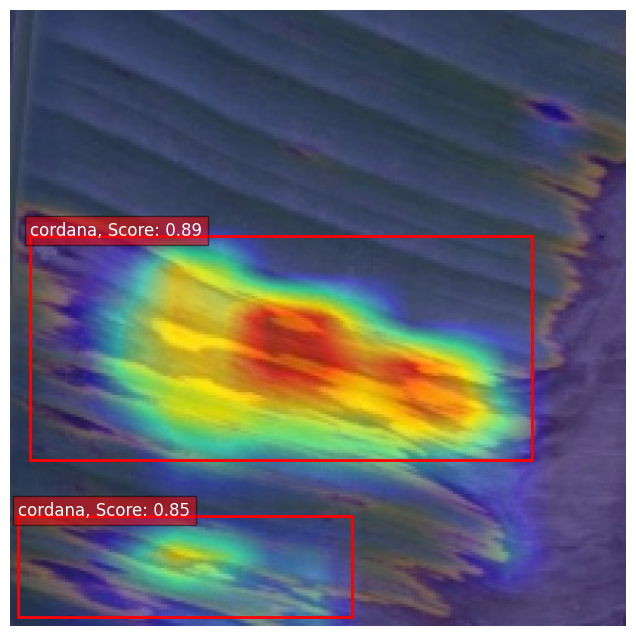

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# Define the class names
class_names = {0: 'Banana', 1: 'cordana', 2: 'healthy', 3: 'pestalotiopsis', 4: 'sigatoka'}

# Function to preprocess the image
def preprocess_image(image_path, device):
    transform = T.Compose([
        T.Resize((640, 640)),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0).to(device)
    return image_tensor, image

# Function to visualize the image with predictions and CAM overlay
def visualize_user_image(image, predictions, class_names, cam_image=None):
    image_np = image.permute(1, 2, 0).cpu().numpy()
    boxes = predictions[0]['boxes'].cpu().detach().numpy()
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    plt.figure(figsize=(12, 8))
    plt.imshow(image_np if cam_image is None else cam_image)

    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:
            x_min, y_min, x_max, y_max = box
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            plt.gca().add_patch(rect)
            class_name = class_names[int(label)]
            plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                     color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Function to perform prediction and apply EigenCAM
def predict_with_cam(model, image_path, device, class_names):
    image_tensor, original_image = preprocess_image(image_path, device)

    model.eval()
    with torch.no_grad():
        predictions = model(image_tensor)

    # Apply EigenCAM
    target_layers = [model.backbone]  # Backbone as target layer
    targets = [FasterRCNNBoxScoreTarget(labels=predictions[0]['labels'],
                                        bounding_boxes=predictions[0]['boxes'])]

    # Initialize EigenCAM without 'use_cuda' argument
    cam = EigenCAM(model=model, target_layers=target_layers, reshape_transform=fasterrcnn_reshape_transform)

    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Take the first image from batch

    # Convert image to float numpy array for overlay
    image_float_np = original_image.resize((640, 640))  # Resize for consistency
    image_float_np = np.array(image_float_np) / 255.0  # Normalize to [0, 1]

    # Overlay CAM on original image
    cam_image = show_cam_on_image(image_float_np, grayscale_cam, use_rgb=True)

    # Visualize the image with bounding boxes and CAM
    visualize_user_image(image_tensor[0], predictions, class_names, cam_image=cam_image)

# Load the Faster R-CNN model
model_path = '/content/drive/MyDrive/Banana_faster_rcnn_full_model.pt'

# Load model to CPU if CUDA is not available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torch.load(model_path, map_location=device)
model.eval()


# Example usage:
image_path = '/content/test/49_jpeg_jpg.rf.eb1fbfea0631140eb1a284d27575f3ad.jpg'  # Replace with the actual image path
predict_with_cam(model, image_path, device, class_names)


<ipython-input-45-4da7d13d953e>:113: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model


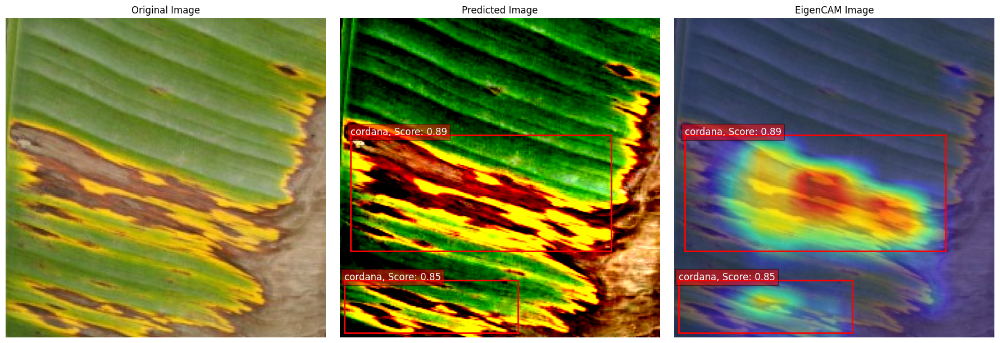

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# Define the class names
class_names = {0: 'Banana', 1: 'cordana', 2: 'healthy', 3: 'pestalotiopsis', 4: 'sigatoka'}

# Unified function to preprocess the image
def preprocess_image(image_path, device):
    # Define the transformation for the input image (Resize, Normalize, etc.)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Load the image using PIL
    image = Image.open(image_path).convert("RGB")

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image

# Function to draw bounding boxes on an image
def draw_boxes(ax, boxes, labels, scores, class_names):
    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            ax.add_patch(rect)  # Draw the bounding box
            class_name = class_names[int(label)]
            ax.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                    color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

# Function to visualize the original image, predicted image, and CAM overlay side by side
def visualize_side_by_side(original_image, image_tensor, predictions, class_names, cam_image):
    # Convert tensor image to numpy array for visualization
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format
    image_np = np.clip(image_np, 0, 1)  # Clip the values between 0 and 1 for valid imshow range

    # Create a figure to show all images side by side
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Show the original image
    axs[0].imshow(np.array(original_image))
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    # Show the predicted image
    axs[1].imshow(image_np)
    axs[1].set_title("Predicted Image")
    draw_boxes(axs[1], boxes, labels, scores, class_names)
    axs[1].axis('off')

    # Show the CAM overlay image
    axs[2].imshow(cam_image)
    axs[2].set_title("EigenCAM Image")
    draw_boxes(axs[2], boxes, labels, scores, class_names)  # Add boxes on the EigenCAM image
    axs[2].axis('off')

    # Display the images
    plt.tight_layout()
    plt.show()

# Function to perform prediction and apply EigenCAM
def predict_with_cam(model, image_path, device, class_names):
    # Preprocess the image using the unified function
    image_tensor, original_image = preprocess_image(image_path, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        predictions = model(image_tensor)

    # Apply EigenCAM
    target_layers = [model.backbone]  # Backbone as target layer
    targets = [FasterRCNNBoxScoreTarget(labels=predictions[0]['labels'],
                                        bounding_boxes=predictions[0]['boxes'])]

    # Initialize EigenCAM
    cam = EigenCAM(model=model, target_layers=target_layers, reshape_transform=fasterrcnn_reshape_transform)

    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Take the first image from batch

    # Convert the original image to a float numpy array for overlay
    image_float_np = original_image.resize((640, 640))  # Resize for consistency
    image_float_np = np.array(image_float_np) / 255.0  # Normalize to [0, 1]

    # Overlay CAM on the original image
    cam_image = show_cam_on_image(image_float_np, grayscale_cam, use_rgb=True)

    # Visualize the original image, predicted image, and CAM side by side
    visualize_side_by_side(original_image, image_tensor[0], predictions, class_names, cam_image)

# Load the Faster R-CNN model
model_path = '/content/drive/MyDrive/Banana_faster_rcnn_full_model.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Example usage:
image_path = '/content/test/49_jpeg_jpg.rf.eb1fbfea0631140eb1a284d27575f3ad.jpg'
predict_with_cam(model, image_path, device, class_names)


In [ ]:
!pip install pycocotools

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


<ipython-input-51-3d73aed36ac5>:132: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model


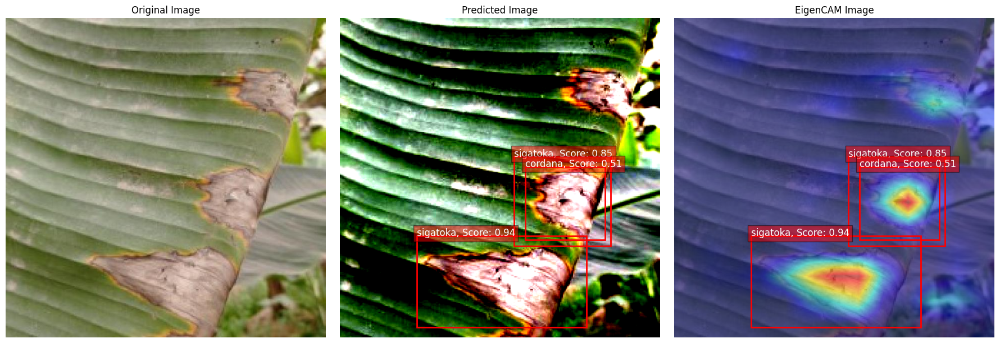

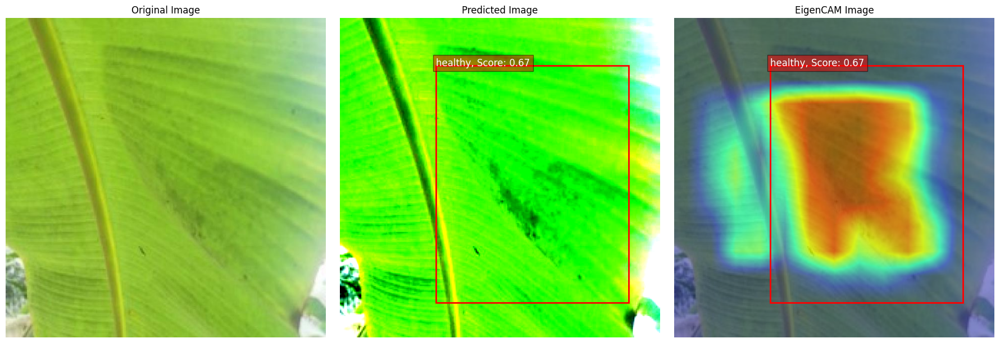

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
# Import CocoDetection from torchvision.datasets
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# Define the class names
class_names = {0: 'Banana', 1: 'cordana', 2: 'healthy', 3: 'pestalotiopsis', 4: 'sigatoka'}

# Unified function to preprocess the image
def preprocess_image(image, device):
    # Define the transformation for the input image (Resize to 640x640 to match CAM size)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 to ensure consistent dimensions
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image.resize((640, 640))  # Resize the original image for overlay



# Function to draw bounding boxes on an image
def draw_boxes(ax, boxes, labels, scores, class_names):
    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            ax.add_patch(rect)  # Draw the bounding box
            class_name = class_names[int(label)]
            ax.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                    color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

# Function to visualize the original image, predicted image, and CAM overlay side by side
def visualize_side_by_side(original_image, image_tensor, predictions, class_names, cam_image):
    # Convert tensor image to numpy array for visualization
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format
    image_np = np.clip(image_np, 0, 1)  # Clip the values between 0 and 1 for valid imshow range

    # Create a figure to show all images side by side
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Show the original image
    axs[0].imshow(np.array(original_image))
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    # Show the predicted image
    axs[1].imshow(image_np)
    axs[1].set_title("Predicted Image")
    draw_boxes(axs[1], boxes, labels, scores, class_names)
    axs[1].axis('off')

    # Show the CAM overlay image
    axs[2].imshow(cam_image)
    axs[2].set_title("EigenCAM Image")
    draw_boxes(axs[2], boxes, labels, scores, class_names)  # Add boxes on the EigenCAM image
    axs[2].axis('off')

    # Display the images
    plt.tight_layout()
    plt.show()

# Function to perform prediction and apply EigenCAM
def predict_with_cam(model, image, device, class_names):
    # Preprocess the image using the unified function
    image_tensor, original_image = preprocess_image(image, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        predictions = model(image_tensor)

    # Apply EigenCAM
    target_layers = [model.backbone]  # Backbone as target layer
    targets = [FasterRCNNBoxScoreTarget(labels=predictions[0]['labels'],
                                        bounding_boxes=predictions[0]['boxes'])]

    # Initialize EigenCAM
    cam = EigenCAM(model=model, target_layers=target_layers, reshape_transform=fasterrcnn_reshape_transform)

    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Take the first image from batch

    # Convert the original image to a float numpy array for overlay
    image_float_np = original_image.resize((640, 640))  # Resize for consistency
    image_float_np = np.array(image_float_np) / 255.0  # Normalize to [0, 1]

    # Overlay CAM on the original image
    # Resize the CAM heatmap to match the original image size
    from skimage.transform import resize

    # After generating the grayscale CAM
    grayscale_cam_resized = resize(grayscale_cam, (image_float_np.shape[0], image_float_np.shape[1]), anti_aliasing=True)

    # Overlay CAM on the original image
    cam_image = show_cam_on_image(image_float_np, grayscale_cam_resized, use_rgb=True)


    # Visualize the original image, predicted image, and CAM side by side
    visualize_side_by_side(original_image, image_tensor[0], predictions, class_names, cam_image)

# Load test dataset using COCO format
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=None)  # No transformation here, do it later

random_indices = random.sample(range(len(test_dataset)), 2)

# Load the Faster R-CNN model
model_path = '/content/drive/MyDrive/Banana_faster_rcnn_full_model.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Loop over the 5 random images
for idx in random_indices:
    img, _ = test_dataset[idx]  # Get the image and its annotation
    predict_with_cam(model, img, device, class_names)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


<ipython-input-52-ae2d4a5e0303>:132: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model


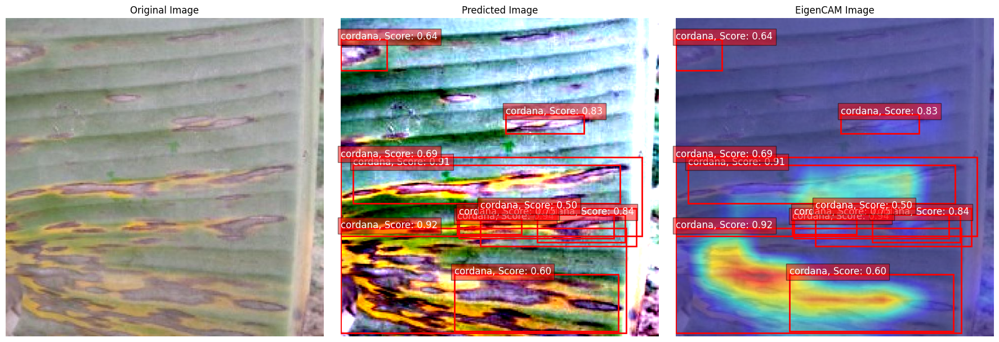

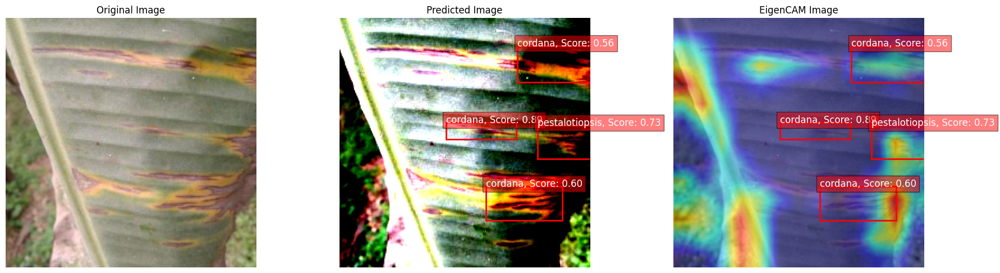

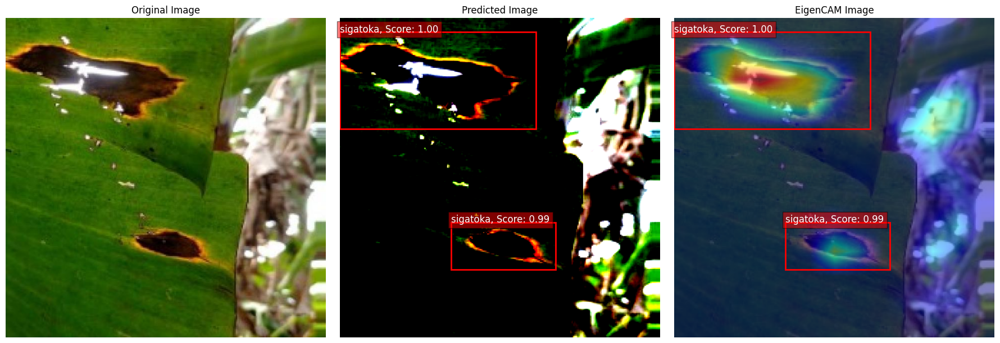

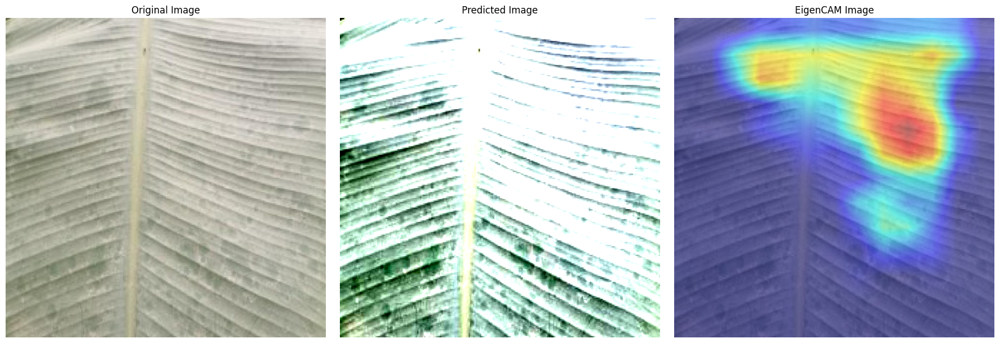

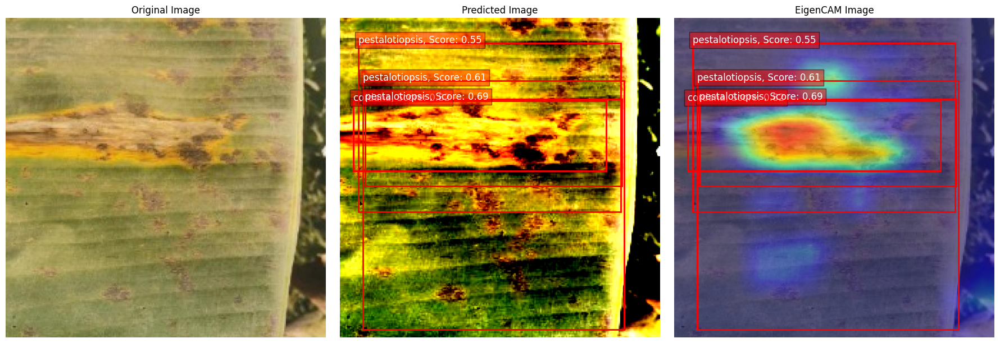

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
# Import CocoDetection from torchvision.datasets
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# Define the class names
class_names = {0: 'Banana', 1: 'cordana', 2: 'healthy', 3: 'pestalotiopsis', 4: 'sigatoka'}

# Unified function to preprocess the image
def preprocess_image(image, device):
    # Define the transformation for the input image (Resize to 640x640 to match CAM size)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 to ensure consistent dimensions
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image.resize((640, 640))  # Resize the original image for overlay



# Function to draw bounding boxes on an image
def draw_boxes(ax, boxes, labels, scores, class_names):
    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            ax.add_patch(rect)  # Draw the bounding box
            class_name = class_names[int(label)]
            ax.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                    color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

# Function to visualize the original image, predicted image, and CAM overlay side by side
def visualize_side_by_side(original_image, image_tensor, predictions, class_names, cam_image):
    # Convert tensor image to numpy array for visualization
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format
    image_np = np.clip(image_np, 0, 1)  # Clip the values between 0 and 1 for valid imshow range

    # Create a figure to show all images side by side
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Show the original image
    axs[0].imshow(np.array(original_image))
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    # Show the predicted image
    axs[1].imshow(image_np)
    axs[1].set_title("Predicted Image")
    draw_boxes(axs[1], boxes, labels, scores, class_names)
    axs[1].axis('off')

    # Show the CAM overlay image
    axs[2].imshow(cam_image)
    axs[2].set_title("EigenCAM Image")
    draw_boxes(axs[2], boxes, labels, scores, class_names)  # Add boxes on the EigenCAM image
    axs[2].axis('off')

    # Display the images
    plt.tight_layout()
    plt.show()

# Function to perform prediction and apply EigenCAM
def predict_with_cam(model, image, device, class_names):
    # Preprocess the image using the unified function
    image_tensor, original_image = preprocess_image(image, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        predictions = model(image_tensor)

    # Apply EigenCAM
    target_layers = [model.backbone]  # Backbone as target layer
    targets = [FasterRCNNBoxScoreTarget(labels=predictions[0]['labels'],
                                        bounding_boxes=predictions[0]['boxes'])]

    # Initialize EigenCAM
    cam = EigenCAM(model=model, target_layers=target_layers, reshape_transform=fasterrcnn_reshape_transform)

    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Take the first image from batch

    # Convert the original image to a float numpy array for overlay
    image_float_np = original_image.resize((640, 640))  # Resize for consistency
    image_float_np = np.array(image_float_np) / 255.0  # Normalize to [0, 1]

    # Overlay CAM on the original image
    # Resize the CAM heatmap to match the original image size
    from skimage.transform import resize

    # After generating the grayscale CAM
    grayscale_cam_resized = resize(grayscale_cam, (image_float_np.shape[0], image_float_np.shape[1]), anti_aliasing=True)

    # Overlay CAM on the original image
    cam_image = show_cam_on_image(image_float_np, grayscale_cam_resized, use_rgb=True)


    # Visualize the original image, predicted image, and CAM side by side
    visualize_side_by_side(original_image, image_tensor[0], predictions, class_names, cam_image)

# Load test dataset using COCO format
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=None)  # No transformation here, do it later

random_indices = random.sample(range(len(test_dataset)), 5)

# Load the Faster R-CNN model
model_path = '/content/drive/MyDrive/Banana_faster_rcnn_full_model.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Loop over the 5 random images
for idx in random_indices:
    img, _ = test_dataset[idx]  # Get the image and its annotation
    predict_with_cam(model, img, device, class_names)